<h1 style="font-size:30px;">Finetuning YOLOv9 for Instance Segmentation on Custom Dataset</h1>

In this notebook, we will finetune the latest YOLOv9c-seg model on NulnSeg Kaggle dataset.

<img src = "https://learnopencv.com/wp-content/uploads/2024/04/Notebook-Feature-Image-YOLOv9-for-Instance-Segmentation.png" width=1000 height=500>



NulnsSeg Kaggle dataset contains more than 30k manually segmented nuclei from 31 human and mouse organs and 665 image patches extracted from H&E-stained whole slide microscopic images. 

The dataset contains tissues of various human and mouse organs.
Key human and mouse organs include the cerebellum, kidney, liver, pancreas, etc.

The dataset contains a single Nuclei class.

The dataset has `665` images in total so we will split it with an 80:20 train val split ratio.
So, the final split has `532` training and `133` validation images, respectively.


Dependencies

In [1]:
!pip install -q ultralytics pycocotools scikit-learn matplotlib 

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.5/749.5 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 37.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 42.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 53.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━

Imports

In [1]:
import os
import copy
import random
import json
import yaml
import glob
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from   zipfile import ZipFile
import argparse
from PIL import Image
import PIL.Image
import shutil
from IPython.display import Image
from sklearn.model_selection import train_test_split

import torch
import torch.utils.data
from torch import nn
import torchvision
from ultralytics import YOLO

from torchvision import transforms as T


from pycocotools import mask as coco_mask
from pycocotools.coco import COCO


This function block is used to **download and unzip** the dataset in the specified directory.

In [2]:
def download_and_unzip(url, save_path, extract_dir):
    print("Downloading assets...")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)
    print("Download completed.")

    try:
        if save_path.endswith(".zip"):
            with ZipFile(save_path, 'r') as zip_ref:
                zip_ref.extractall(extract_dir)
            print("Extraction Done")
    except Exception as e:
        print(f"An error occurred: {e}")

DATASET_URL = r"https://www.dropbox.com/scl/fi/u83yuoea9hu7xhhhsgp4d/Nuclei_Instance_Seg.zip?rlkey=7tw3vs4xh7rych4yq1xizd8mh&dl=1"
DATASET_DIR = "Nuclei-Instance-Dataset"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Download and extract if dataset does not exist.
if not os.path.exists(DATASET_DIR):
    os.makedirs(DATASET_DIR, exist_ok=True)  # Ensure the directory exists
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH, DATASET_DIR)
    os.remove(DATASET_ZIP_PATH)  # Remove the zip file after extraction


Download completed.
Extraction Done


## Data Preparation

The dataset comes with many subdirectories. However, for our `YOLOv9c-seg` fine-tuning, we just need the raw images and labeled masks, which we will convert to the appropriate format. 

For our task, we will keep the directories with subdirectories named `‘tissue images’` , `‘mask binary without border’`, and `‘label masks modify’`.


In [5]:


def prune_subdirectories(base_dir,keep_dirs):
    #Iterate through each subdirs in base dir
    for root_dir in os.listdir(base_dir):
        root_path = os.path.join(base_dir,root_dir)
        if os.path.isdir(root_path):
          #  print(f"Processing: {root_path}")
           #List all subdirs inside the current root dir
           for sub_dir in os.listdir(root_path):
               sub_path = os.path.join(root_path, sub_dir)
               #If the subdirectory isn't in the keep list, delete it
               if os.path.isdir(sub_path) and sub_dir not in keep_dirs:
                  # print(f"Deleting: {sub_path}")
                  shutil.rmtree(sub_path)
               elif os.path.isdir(sub_path):
                  # print(f"Keeping: {sub_path}")
                  pass


base_directory = "./Nuclei-Instance-Dataset"
directories_to_keep = ['tissue images', 'mask binary witthout border', 'label masks modify']

prune_subdirectories(base_directory,directories_to_keep)



In [8]:

!sudo apt install tree

UsageError: Line magic function `%capture` not found (But cell magic `%%capture` exists, did you mean that instead?).


In [7]:
!tree --dirsfirst -L 2  "Nuclei-Instance-Dataset"

Nuclei-Instance-Dataset
├── human bladder
│   ├── label masks modify
│   └── tissue images
├── human brain
│   ├── label masks modify
│   └── tissue images
├── human cardia
│   ├── label masks modify
│   └── tissue images
├── human cerebellum
│   ├── label masks modify
│   └── tissue images
├── human epiglottis
│   ├── label masks modify
│   └── tissue images
├── human jejunum
│   ├── label masks modify
│   └── tissue images
├── human kidney
│   ├── label masks modify
│   └── tissue images
├── human liver
│   ├── label masks modify
│   └── tissue images
├── human lung
│   ├── label masks modify
│   └── tissue images
├── human melanoma
│   ├── label masks modify
│   └── tissue images
├── human muscle
│   ├── label masks modify
│   └── tissue images
├── human oesophagus
│   ├── label masks modify
│   └── tissue images
├── human pancreas
│   ├── label masks modify
│   ├── tissue images
│   └── Thumbs.db
├── human peritoneum
│   ├── label masks modify
│   └── tissue images
├── human placen

## Convert Label Masks to Yolo Annotations

Next, let’s try to convert our annotations from binary masks to YOLO format. As an intermediate step, let’s convert them to COCO JSON format, which is easy to interpret.

The `get_image_mask_pairs( )` returns all image and mask paths from the dataset appended to a list.


Binary masks are a common way to represent object annotations in segmentation tasks. They efficiently encode the shape of objects at the pixel level. However, for tasks like visualization or calculating object properties, we need to convert these masks into polygons.
`mask_to_polygons( )` shows one such approach to extract polygons from a binary mask.

In [15]:

def get_image_mask_pairs(data_dir):
    image_paths = []
    mask_paths = []

    for root,_,files in os.walk(data_dir):
        if 'tissue images' in root:
            for file in files:
                if file.endswith('.png'):
                    image_paths.append(os.path.join(root,file))
                    mask_paths.append(os.path.join(root.replace('tissue images','label masks modify'), file.replace('.png','.tif')))
    return image_paths, mask_paths


We need to convert our tissue’s binary mask to actionable polygon points. For this, let’s use `cv2.findContours` to extract approximate polygons of the binary mask. This ensures we get a valid closed polygon with more than 4 sides and outlines around mask borders.
By using `cv2.RETR_TREE` as contour retrieval mode, we can reconstruct a hierarchical relationship between all the detected contours.

In [16]:
def mask_to_polygons(mask,epsilon=1.0):
    contours,_ = cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    for contour in contours:
        if len(contour) > 2:
           poly = contour.reshape(-1).tolist()
           if len(poly) > 4: #Ensures valid polygon
              polygons.append(poly)
    return polygons

## Dataset Preparation

In `process_data( )`, we will initialize annotation and images as empty lists to which we will append all the metadata. Additionally, image ID and ann ID will have zero as initial values.

We will simultaneously iterate through the image_paths and mask_path list we got from the  `get_image_mask_pairs` utility function. For each image, we assign a unique `image_id` by incrementing with 1 after each iteration. Then, we will read our image and mask using opencv. The `cv2.IMREAD_UNCHANGED` helps to read masks, including an alpha channel if present.

For each value representing an object(ignoring background), we construct a binary mask where pixels corresponding to the current unique value are set to 255(white) to highlight the object instance. 

While all other pixels are set to 0(black) effectively isolating the object from the background. The binary mask is then passed as input to the `mask_to_polygons( )` function, which processes the mask and returns a series of polygons.


In [17]:
def process_data(image_paths, mask_paths, output_images_dir, output_labels_dir):
    annotations = []
    images = []
    image_id = 0
    ann_id = 0

    for img_path, mask_path in zip(image_paths, mask_paths):
        image_id += 1
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
        shutil.copy(img_path, os.path.join(output_images_dir, os.path.basename(img_path)))

        # Add image to the list
        images.append({
            "id": image_id,
            "file_name": os.path.basename(img_path),
            "height": img.shape[0],
            "width": img.shape[1]
        })

        unique_values = np.unique(mask)
        for value in unique_values:
            if value == 0:  # Ignore background
                continue

            object_mask = (mask == value).astype(np.uint8) * 255
            polygons = mask_to_polygons(object_mask)

            for poly in polygons:
                ann_id += 1
                annotations.append({
                    "id": ann_id,
                    "image_id": image_id,
                    "category_id": 1,  # Only one category: Nuclei
                    "segmentation": [poly],
                    "area": cv2.contourArea(np.array(poly).reshape(-1, 2)),
                    "bbox": list(cv2.boundingRect(np.array(poly).reshape(-1, 2))),
                    "iscrowd": 0
                })

    coco_input = {
        "images": images,
        "annotations": annotations,
        "categories": [{"id": 1, "name": "Nuclei"}]
    }

    # Convert COCO-like dictionary to YOLO format
    for img_info in coco_input["images"]:
        img_id = img_info["id"]
        img_ann = [ann for ann in coco_input["annotations"] if ann["image_id"] == img_id]
        img_w, img_h = img_info["width"], img_info["height"]

        if img_ann:
            with open(os.path.join(output_labels_dir, os.path.splitext(img_info["file_name"])[0] + '.txt'), 'w') as file_object:
                for ann in img_ann:
                    current_category = ann['category_id'] - 1
                    polygon = ann['segmentation'][0]
                    normalized_polygon = [format(coord / img_w if i % 2 == 0 else coord / img_h, '.6f') for i, coord in enumerate(polygon)]
                    file_object.write(f"{current_category} " + " ".join(normalized_polygon) + "\n")



Now, for each image, a corresponding .txt annotation file is created, and we extract the ‘category_id’ and ‘polygon’ of the current object instance in a recurring loop. The polygon is then normalized relative to the current image dimensions. Thus, a set of .txt files for all images is created in the output labels dir, which will be utilized during fine-tuning.

In [18]:
def create_yaml(output_yaml_path, train_images_dir, val_images_dir, nc=1):
    # Assuming all categories are the same and there is only one class, 'Nuclei'
    names = ['Nuclei']

    # Create a dictionary with the required content
    yaml_data = {
        'names': names,
        'nc': nc,  # Number of classes
        'train': train_images_dir,
        'val': val_images_dir,
        'test': ' '

    }

    # Write the dictionary to a YAML file
    with open(output_yaml_path, 'w') as file:
        yaml.dump(yaml_data, file, default_flow_style=False)


Now, the `yolo_dataset_preparation( )` function defines all the paths and calls the required set of utility functions. To simply put, this function is responsible for extracting the polygons from the raw binary masks and converting them into YOLO format. Finally, it creates `data.yaml` file for our finetuning.

In [19]:
def yolo_dataset_preparation():
    data_dir = 'Nuclei-Instance-Dataset'
    output_dir = 'yolov9_dataset'

    # Define the paths for the images and labels for training and validation
    train_images_dir = os.path.join(output_dir, 'train', 'images')
    val_images_dir = os.path.join(output_dir, 'val', 'images')
    train_labels_dir = os.path.join(output_dir, 'train', 'labels')
    val_labels_dir = os.path.join(output_dir, 'val', 'labels')

    # Create the output directories if they do not exist
    os.makedirs(train_images_dir, exist_ok=True)
    os.makedirs(val_images_dir, exist_ok=True)
    os.makedirs(train_labels_dir, exist_ok=True)
    os.makedirs(val_labels_dir, exist_ok=True)

    # Get image and mask paths
    image_paths, mask_paths = get_image_mask_pairs(data_dir)

    # Split data into train and val
    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(image_paths, mask_paths, test_size=0.2, random_state=42)

    # Process and save the data in YOLO format for training and validation
    process_data(train_img_paths, train_mask_paths, train_images_dir, train_labels_dir)
    process_data(val_img_paths, val_mask_paths, val_images_dir, val_labels_dir)

    # Assume create_yaml function is defined elsewhere and set appropriate paths for the YAML file
    output_yaml_path = os.path.join(output_dir, 'data.yaml')
    train_path = os.path.join('train', 'images')
    val_path = os.path.join('val', 'images')
    create_yaml(output_yaml_path, train_path, val_path)

yolo_dataset_preparation()


## Model Configuration

In [21]:
#Instance
model = YOLO("yolov9c-seg.yaml")#build a model from YAML
model = YOLO("yolov9c-seg.pt") #Transfer the weights from a pretrained model (recommended for training)

100%|██████████| 53.9M/53.9M [00:00<00:00, 252MB/s]


**Restart session if dill package gets updated**

In [22]:
%cat yolov9_dataset/data.yaml

names:
- Nuclei
nc: 1
test: ' '
train: train/images
val: val/images


In [23]:
with open("yolov9_dataset/data.yaml",'r') as stream:
     num_classes = str(yaml.safe_load(stream)['nc'])

## Train the Model

In [24]:
#Define a project --> Destination directory for all results
project = "yolov9_dataset/results"
#Define subdirectory for this specific training
name = "70_epochs-"


In [25]:
ABS_PATH = os.getcwd()


We will train our models for 70 epochs and save our training logs into the specified project directory.


In [26]:
#Train the model
results = model.train(
    data = os.path.join(ABS_PATH, "yolov9_dataset/data.yaml"),
    project = project,
    name = name,
    epochs = 70,
    patience = 0 , #setting patience=0 to disable early stopping,
    batch = 4,
)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
engine/trainer: task=segment, mode=train, model=yolov9c-seg.pt, data=/v9c_workspace_640/yolov9_dataset/data.yaml, epochs=70, time=None, patience=0, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov9_dataset/results, name=70_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_

100%|██████████| 6.23M/6.23M [00:00<00:00, 89.9MB/s]


AMP: checks passed ✅


train: Scanning /v9c_workspace_640/yolov9_dataset/train/labels... 532 images, 0 backgrounds, 0 corrupt: 100%|██████████| 532/532 [00:02<00:00, 189.53it/s]


train: New cache created: /v9c_workspace_640/yolov9_dataset/train/labels.cache


val: Scanning /v9c_workspace_640/yolov9_dataset/val/labels... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 154.65it/s]

val: New cache created: /v9c_workspace_640/yolov9_dataset/val/labels.cache


Plotting labels to yolov9_dataset/results/70_epochs-/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 163 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov9_dataset/results/70_epochs-
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/70      10.9G       1.84      2.845      1.366      1.443        247        640: 100%|██████████| 133/133 [00:20<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]

                   all        133       6958       0.45      0.526      0.373      0.185      0.446      0.497      0.346      0.154



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/70      9.75G      1.795      2.757      1.181      1.425        183        640: 100%|██████████| 133/133 [00:18<00:00,  7.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.24it/s]


                   all        133       6958      0.425      0.515      0.314      0.154      0.411       0.49      0.292      0.125

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/70      6.01G      1.839      2.823      1.181      1.424        217        640: 100%|██████████| 133/133 [00:17<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.24it/s]

                   all        133       6958      0.705      0.629      0.682      0.326       0.71      0.623      0.673      0.294



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/70      12.1G      1.807      2.712       1.16      1.413        159        640: 100%|██████████| 133/133 [00:17<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.02it/s]

                   all        133       6958      0.729      0.637      0.709      0.351      0.735      0.622      0.696      0.321



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/70      10.2G      1.776      2.623      1.111      1.377        123        640: 100%|██████████| 133/133 [00:17<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.16it/s]


                   all        133       6958      0.779      0.676      0.765      0.393      0.764      0.652      0.733      0.333

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/70      7.25G      1.716      2.563      1.049      1.363        223        640: 100%|██████████| 133/133 [00:17<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.34it/s]

                   all        133       6958      0.776      0.655      0.751      0.377      0.772      0.644      0.736      0.332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/70      13.6G      1.745      2.561      1.057      1.379        216        640: 100%|██████████| 133/133 [00:17<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.14it/s]

                   all        133       6958      0.769      0.669      0.763      0.414      0.759      0.648      0.737      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/70      11.4G      1.713      2.605       1.09      1.355         93        640: 100%|██████████| 133/133 [00:17<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.28it/s]

                   all        133       6958      0.778      0.671      0.746      0.408      0.772      0.654      0.725      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/70      13.7G      1.675      2.506      1.009      1.348        237        640: 100%|██████████| 133/133 [00:17<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.13it/s]


                   all        133       6958      0.705      0.653      0.715      0.358      0.701      0.641      0.698      0.309

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/70       7.7G       1.74       2.55      1.013      1.343        271        640: 100%|██████████| 133/133 [00:17<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.31it/s]


                   all        133       6958      0.789      0.672       0.77        0.4      0.779      0.653      0.743      0.345

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/70      7.48G      1.695      2.527      1.014      1.359        164        640: 100%|██████████| 133/133 [00:17<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.29it/s]

                   all        133       6958      0.788      0.708      0.796      0.434      0.783      0.698      0.779      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/70      12.9G      1.673      2.469     0.9804      1.319        184        640: 100%|██████████| 133/133 [00:17<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]

                   all        133       6958      0.791      0.703      0.783      0.424      0.772      0.688      0.759      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/70      8.18G      1.659      2.414     0.9561      1.303        162        640: 100%|██████████| 133/133 [00:17<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.35it/s]

                   all        133       6958      0.792      0.683      0.778      0.422      0.782      0.675      0.761      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/70      8.69G      1.651      2.408     0.9369      1.301        211        640: 100%|██████████| 133/133 [00:17<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.54it/s]

                   all        133       6958      0.787      0.687      0.786      0.427       0.78      0.671      0.769      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/70      12.4G      1.649      2.416     0.9712      1.315        483        640: 100%|██████████| 133/133 [00:17<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.34it/s]

                   all        133       6958       0.78      0.694      0.781      0.429      0.771      0.679      0.758      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/70      11.9G      1.612      2.363     0.9263      1.282        320        640: 100%|██████████| 133/133 [00:17<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.27it/s]

                   all        133       6958      0.794      0.729      0.808      0.446      0.786      0.715      0.789      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/70      7.94G      1.645      2.389     0.9794      1.299        403        640: 100%|██████████| 133/133 [00:17<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.782      0.689      0.769      0.433      0.768      0.667      0.744      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/70        10G      1.581      2.317     0.9216      1.285        118        640: 100%|██████████| 133/133 [00:17<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]

                   all        133       6958      0.805      0.728      0.813      0.457      0.801      0.712      0.799      0.407



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/70      10.6G      1.593      2.328      0.921      1.288        423        640: 100%|██████████| 133/133 [00:17<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.62it/s]

                   all        133       6958      0.809      0.719      0.803      0.451      0.816      0.701      0.789      0.405



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/70      6.99G      1.599      2.318     0.9306      1.288        362        640: 100%|██████████| 133/133 [00:17<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.18it/s]

                   all        133       6958      0.793      0.716      0.806      0.449       0.78      0.702      0.786      0.391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/70      12.7G      1.565      2.299     0.8898      1.261        323        640: 100%|██████████| 133/133 [00:17<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]

                   all        133       6958      0.795      0.721      0.807      0.449       0.79      0.703      0.784       0.39



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/70      6.17G      1.598       2.34     0.9078      1.279        124        640: 100%|██████████| 133/133 [00:17<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.25it/s]

                   all        133       6958      0.814      0.708      0.805      0.456      0.806      0.696      0.789        0.4



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/70      12.5G      1.575      2.284     0.8853      1.258        177        640: 100%|██████████| 133/133 [00:17<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.799      0.715       0.81      0.449      0.794      0.696      0.785      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/70      8.65G      1.583      2.298     0.8993      1.272        240        640: 100%|██████████| 133/133 [00:17<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.25it/s]


                   all        133       6958      0.805      0.697      0.794      0.447      0.809      0.677      0.773      0.384

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/70       9.9G      1.568      2.272     0.8835      1.258        204        640: 100%|██████████| 133/133 [00:18<00:00,  7.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.29it/s]

                   all        133       6958      0.828       0.74       0.83      0.461       0.82      0.727      0.811      0.403



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/70      11.1G      1.566      2.252     0.8723      1.276         92        640: 100%|██████████| 133/133 [00:17<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.30it/s]

                   all        133       6958      0.812       0.73      0.821      0.467      0.812      0.717      0.807      0.418



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/70      10.1G      1.572      2.286     0.8824      1.267        124        640: 100%|██████████| 133/133 [00:17<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.38it/s]

                   all        133       6958      0.815      0.745       0.83      0.474      0.811      0.735      0.816      0.424



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/70      10.4G      1.569      2.274     0.8581      1.261         78        640: 100%|██████████| 133/133 [00:17<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]

                   all        133       6958      0.824      0.753      0.831      0.471      0.812      0.737       0.81      0.411



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/70      9.62G      1.524      2.209     0.8503      1.255        143        640: 100%|██████████| 133/133 [00:17<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.25it/s]

                   all        133       6958      0.836       0.73      0.826      0.472      0.828      0.714      0.807       0.41



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/70      11.4G      1.538       2.23     0.8676      1.255        166        640: 100%|██████████| 133/133 [00:17<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.35it/s]

                   all        133       6958      0.819      0.745      0.826      0.459      0.809      0.735       0.81      0.404



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/70      8.32G      1.548      2.246     0.8806      1.246        424        640: 100%|██████████| 133/133 [00:17<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.28it/s]


                   all        133       6958       0.81      0.721      0.818      0.468        0.8      0.712      0.804      0.413

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/70      10.9G      1.519      2.217     0.8696      1.256        465        640: 100%|██████████| 133/133 [00:17<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]

                   all        133       6958      0.825      0.746      0.831      0.476      0.817      0.735      0.812      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/70      13.6G       1.53      2.212     0.8517      1.237        219        640: 100%|██████████| 133/133 [00:17<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.39it/s]


                   all        133       6958       0.82      0.719      0.813      0.464      0.816      0.705      0.801      0.415

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/70      10.7G      1.517      2.183      0.842      1.242        336        640: 100%|██████████| 133/133 [00:17<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]


                   all        133       6958      0.829      0.743      0.835      0.479       0.82       0.73      0.819      0.422

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/70      11.3G      1.497       2.19     0.8311      1.235        520        640: 100%|██████████| 133/133 [00:17<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.41it/s]

                   all        133       6958      0.828      0.757      0.836      0.478      0.824      0.746      0.824      0.425



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/70      9.33G      1.519      2.201     0.8345      1.239        224        640: 100%|██████████| 133/133 [00:17<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.18it/s]

                   all        133       6958      0.829      0.734      0.825      0.461      0.816      0.719      0.807      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/70      12.3G      1.538      2.221     0.8474       1.24        154        640: 100%|██████████| 133/133 [00:17<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.29it/s]

                   all        133       6958      0.827      0.756      0.841      0.477      0.825      0.741      0.827      0.421



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/70      13.5G      1.479      2.163     0.8294      1.234        174        640: 100%|██████████| 133/133 [00:17<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]


                   all        133       6958      0.832      0.753      0.843      0.485      0.823      0.739      0.826       0.43

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/70      9.51G      1.494      2.164     0.8192      1.245        236        640: 100%|██████████| 133/133 [00:17<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.31it/s]

                   all        133       6958      0.843      0.744      0.838      0.474       0.83      0.732      0.816       0.41



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/70      9.34G      1.508      2.185     0.8418      1.226        487        640: 100%|██████████| 133/133 [00:17<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.42it/s]

                   all        133       6958       0.82      0.747      0.834      0.481      0.819      0.734      0.821      0.424



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/70       9.1G      1.502      2.179     0.8203      1.231        492        640: 100%|██████████| 133/133 [00:17<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.35it/s]

                   all        133       6958      0.831      0.735      0.825       0.48      0.826      0.723      0.809      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/70      12.7G       1.51      2.195     0.8217       1.23        348        640: 100%|██████████| 133/133 [00:17<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.52it/s]

                   all        133       6958      0.824      0.739      0.824      0.477      0.818      0.718      0.806      0.421



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/70      13.3G      1.509      2.183     0.8403      1.235        244        640: 100%|██████████| 133/133 [00:17<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.42it/s]

                   all        133       6958      0.828      0.742      0.834      0.481      0.819      0.733      0.816      0.423



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/70      11.7G      1.487      2.141     0.8027      1.218        317        640: 100%|██████████| 133/133 [00:17<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.38it/s]

                   all        133       6958      0.828      0.771      0.849      0.488      0.822      0.752      0.831      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/70      10.2G      1.488      2.135     0.8039      1.225        126        640: 100%|██████████| 133/133 [00:17<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.41it/s]

                   all        133       6958      0.827      0.748      0.835      0.475      0.819      0.738      0.822      0.419



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/70      7.86G      1.501      2.156     0.8168      1.244        219        640: 100%|██████████| 133/133 [00:17<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.69it/s]

                   all        133       6958      0.833      0.749      0.837      0.486      0.828      0.737      0.825      0.433



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/70      7.72G      1.479      2.142     0.8076      1.219        452        640: 100%|██████████| 133/133 [00:17<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.29it/s]

                   all        133       6958      0.826      0.754       0.84      0.484      0.817      0.745      0.825      0.428



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/70      6.45G      1.483      2.125     0.8119      1.221        181        640: 100%|██████████| 133/133 [00:17<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]

                   all        133       6958      0.838      0.762      0.847      0.491      0.828      0.755      0.833      0.435



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/70      9.62G       1.46      2.104      0.784      1.205        140        640: 100%|██████████| 133/133 [00:18<00:00,  7.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.65it/s]

                   all        133       6958      0.838      0.754      0.847      0.492      0.833      0.734      0.825      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/70      10.9G      1.471      2.113     0.7857       1.22        132        640: 100%|██████████| 133/133 [00:17<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.77it/s]

                   all        133       6958      0.832      0.771      0.851      0.495      0.828      0.762      0.839      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/70      12.8G      1.456      2.082     0.7712      1.203        297        640: 100%|██████████| 133/133 [00:17<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.55it/s]

                   all        133       6958      0.847      0.752      0.841       0.49      0.838      0.737      0.825      0.432



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/70      8.55G      1.471      2.083     0.7863      1.221        150        640: 100%|██████████| 133/133 [00:16<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.60it/s]

                   all        133       6958      0.833      0.767      0.851      0.493      0.826       0.76      0.839      0.436



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/70        10G      1.448      2.084     0.7636       1.21         64        640: 100%|██████████| 133/133 [00:16<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.74it/s]


                   all        133       6958      0.843      0.755      0.847      0.495      0.838      0.735       0.83      0.435

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/70      12.4G      1.445      2.074     0.7744      1.204        128        640: 100%|██████████| 133/133 [00:16<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.55it/s]

                   all        133       6958      0.829      0.775      0.854      0.497      0.825      0.762      0.841      0.439



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/70      12.5G       1.45      2.052     0.7671      1.206        182        640: 100%|██████████| 133/133 [00:16<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.41it/s]

                   all        133       6958      0.825      0.765      0.844      0.484       0.82      0.756      0.833      0.433



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/70      10.6G      1.459       2.08     0.7714      1.208        159        640: 100%|██████████| 133/133 [00:16<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.76it/s]

                   all        133       6958      0.842      0.758       0.85      0.493      0.845      0.738      0.835      0.438



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/70       9.2G       1.45      2.076     0.7721      1.195        130        640: 100%|██████████| 133/133 [00:17<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.48it/s]


                   all        133       6958       0.84      0.764      0.852      0.498       0.83      0.753      0.836      0.444

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/70      12.2G      1.444      2.068     0.7603      1.188        213        640: 100%|██████████| 133/133 [00:16<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.63it/s]

                   all        133       6958      0.836      0.761       0.85      0.492      0.832      0.748      0.834      0.433



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/70      11.6G      1.409      2.018     0.7388      1.189        292        640: 100%|██████████| 133/133 [00:17<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.63it/s]

                   all        133       6958      0.842       0.76      0.853      0.495       0.83      0.746      0.832      0.432



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/70      7.21G      1.428      2.027     0.7478      1.213        208        640: 100%|██████████| 133/133 [00:16<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.78it/s]

                   all        133       6958       0.84      0.766      0.852      0.498      0.837      0.751      0.839      0.438


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/70      9.31G      1.436      2.065     0.7692       1.26        104        640: 100%|██████████| 133/133 [00:16<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.35it/s]

                   all        133       6958      0.839      0.771      0.853      0.495      0.835      0.757      0.838      0.438



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/70      12.9G      1.439      2.049     0.7714      1.259         96        640: 100%|██████████| 133/133 [00:16<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.69it/s]

                   all        133       6958      0.829      0.782      0.853      0.498      0.826      0.769      0.839       0.44



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/70      13.2G      1.426      2.029      0.757      1.253        163        640: 100%|██████████| 133/133 [00:16<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.58it/s]

                   all        133       6958      0.832      0.767      0.853      0.498      0.825      0.758      0.838      0.442



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/70      10.6G      1.422      2.011     0.7708      1.228        334        640: 100%|██████████| 133/133 [00:16<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.80it/s]

                   all        133       6958      0.836      0.773      0.857      0.496      0.828      0.761      0.843      0.445



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/70      10.6G      1.445      2.043     0.7621      1.255         78        640: 100%|██████████| 133/133 [00:16<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.58it/s]


                   all        133       6958       0.85      0.776      0.859      0.498      0.838      0.766      0.843      0.442

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/70      10.2G      1.419      2.012     0.7441      1.225        101        640: 100%|██████████| 133/133 [00:16<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.66it/s]

                   all        133       6958      0.844      0.774      0.856      0.502      0.841      0.765      0.844       0.45



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/70        10G      1.408      2.004     0.7336      1.229        103        640: 100%|██████████| 133/133 [00:16<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.60it/s]

                   all        133       6958      0.842       0.78      0.862      0.503      0.839      0.764      0.848      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/70      9.27G      1.403      2.004     0.7442      1.233         21        640: 100%|██████████| 133/133 [00:16<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.67it/s]

                   all        133       6958      0.852      0.762      0.857      0.503      0.844      0.749      0.841      0.444



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/70      8.99G      1.405      1.981     0.7276      1.233         90        640: 100%|██████████| 133/133 [00:16<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.75it/s]

                   all        133       6958      0.847      0.774      0.861      0.505      0.842      0.759      0.844      0.451



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/70      11.3G      1.382      1.963     0.7207      1.213        148        640: 100%|██████████| 133/133 [00:16<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.78it/s]

                   all        133       6958      0.848      0.771      0.859      0.505      0.842      0.759      0.844      0.447



70 epochs completed in 0.468 hours.
Optimizer stripped from yolov9_dataset/results/70_epochs-/weights/last.pt, 56.2MB
Optimizer stripped from yolov9_dataset/results/70_epochs-/weights/best.pt, 56.2MB

Validating yolov9_dataset/results/70_epochs-/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
YOLOv9c-seg summary (fused): 411 layers, 27625299 parameters, 0 gradients, 157.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.80it/s]


                   all        133       6958      0.847      0.774      0.861      0.505      0.841       0.76      0.845      0.451
Speed: 0.2ms preprocess, 8.9ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to yolov9_dataset/results/70_epochs-


In [20]:
%load_ext tensorboard
%tensorboard --logdir yolov9_dataset/results/70_epochs-

<IPython.core.display.Javascript object>

YOLOv9 Training logs

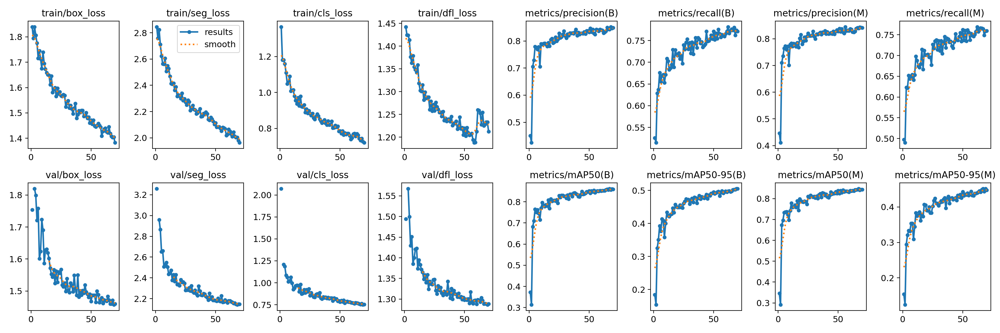

In [27]:
Image("yolov9_dataset/results/70_epochs-/results.png")

## Inference

The best model weight after training for `70 epochs` is loaded for inference.

In [2]:
inference_model = YOLO('yolov9_dataset/results/70_epochs-/weights/best.pt')


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_bladder_03.png: 640x640 10 Nucleis, 77.8ms
Speed: 2.9ms preprocess, 77.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


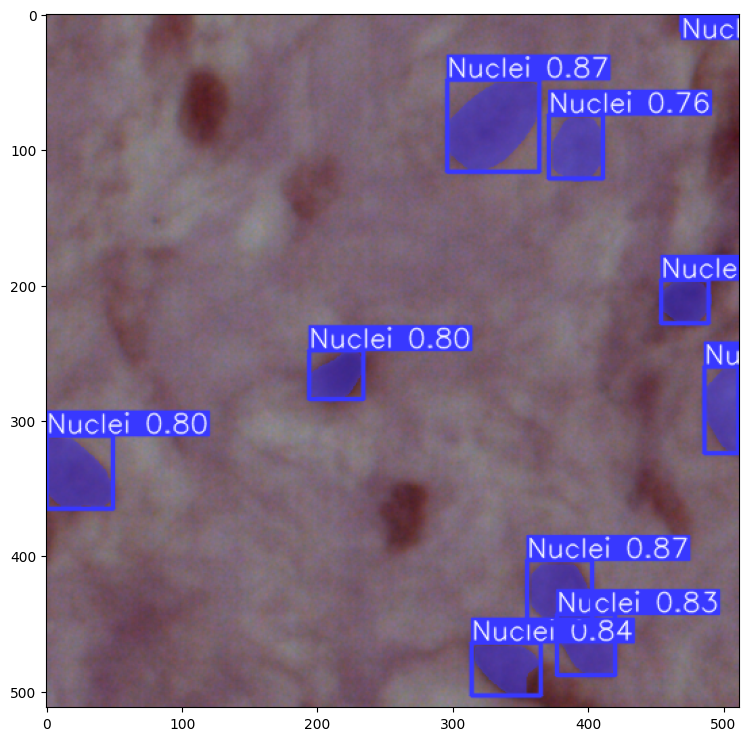

In [3]:
%matplotlib inline
inference_img_path = "yolov9_dataset/val/images/human_bladder_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_cerebellum_6.png: 640x640 53 Nucleis, 77.9ms
Speed: 2.4ms preprocess, 77.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


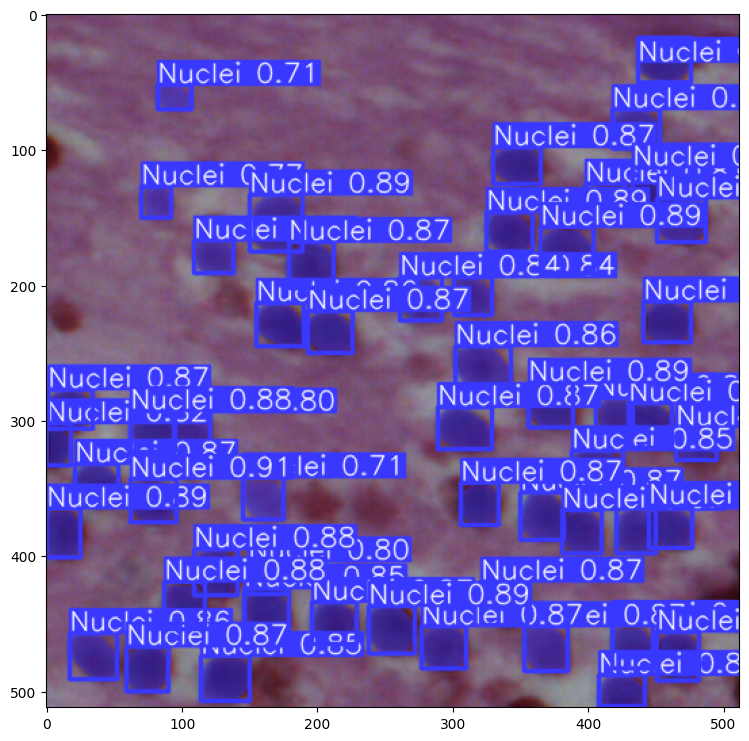

In [5]:
inference_img_path = "yolov9_dataset/val/images/human_cerebellum_6.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_epiglottis_4.png: 640x640 5 Nucleis, 97.5ms
Speed: 22.5ms preprocess, 97.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


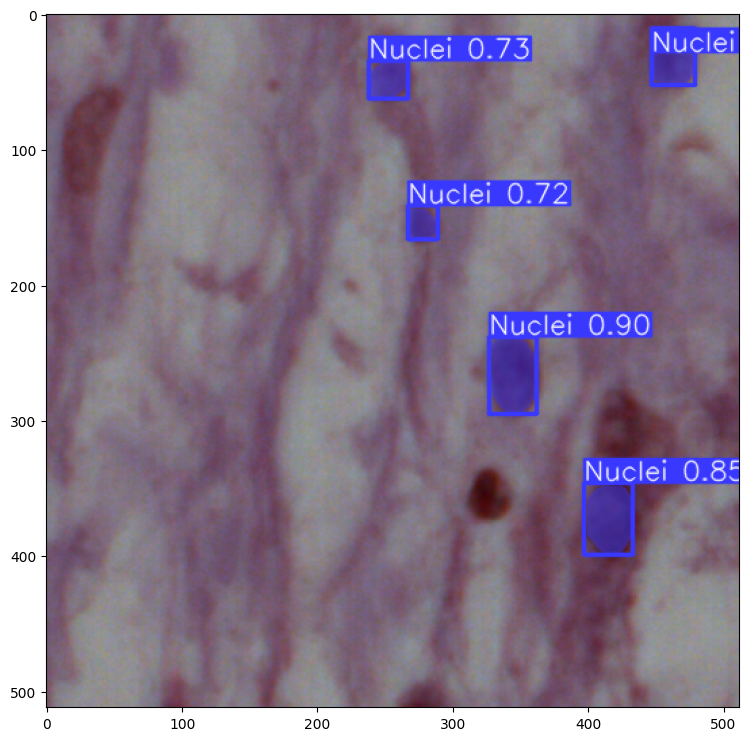

In [6]:
inference_img_path = "yolov9_dataset/val/images/human_epiglottis_4.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_jejunum_02.png: 640x640 41 Nucleis, 99.4ms
Speed: 20.2ms preprocess, 99.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


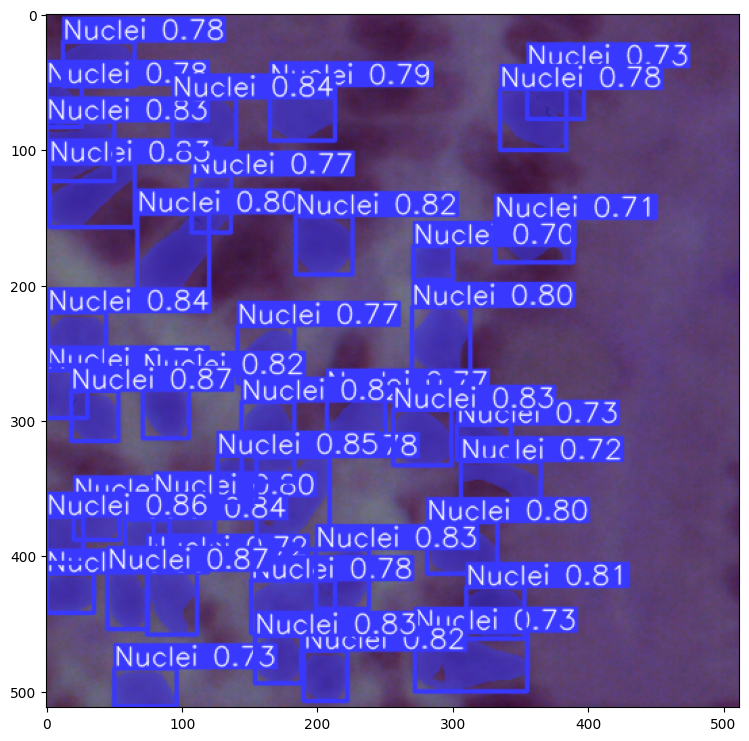

In [7]:
inference_img_path = "yolov9_dataset/val/images/human_jejunum_02.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_kidney_01.png: 640x640 52 Nucleis, 96.9ms
Speed: 20.5ms preprocess, 96.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


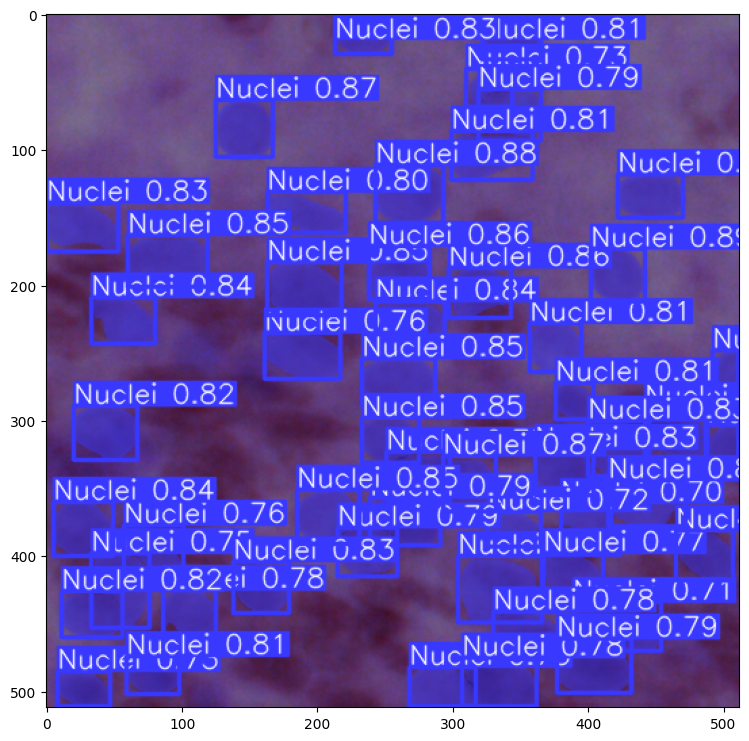

In [8]:
inference_img_path = "yolov9_dataset/val/images/human_kidney_01.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_liver_22.png: 640x640 28 Nucleis, 98.3ms
Speed: 22.2ms preprocess, 98.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


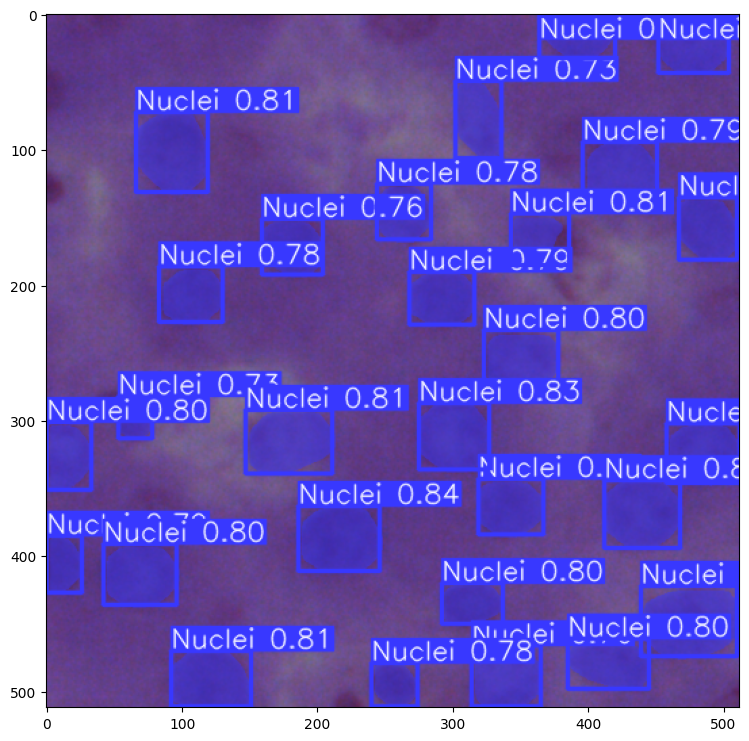

In [9]:
inference_img_path = "yolov9_dataset/val/images/human_liver_22.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_melanoma_03.png: 640x640 13 Nucleis, 96.4ms
Speed: 22.6ms preprocess, 96.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


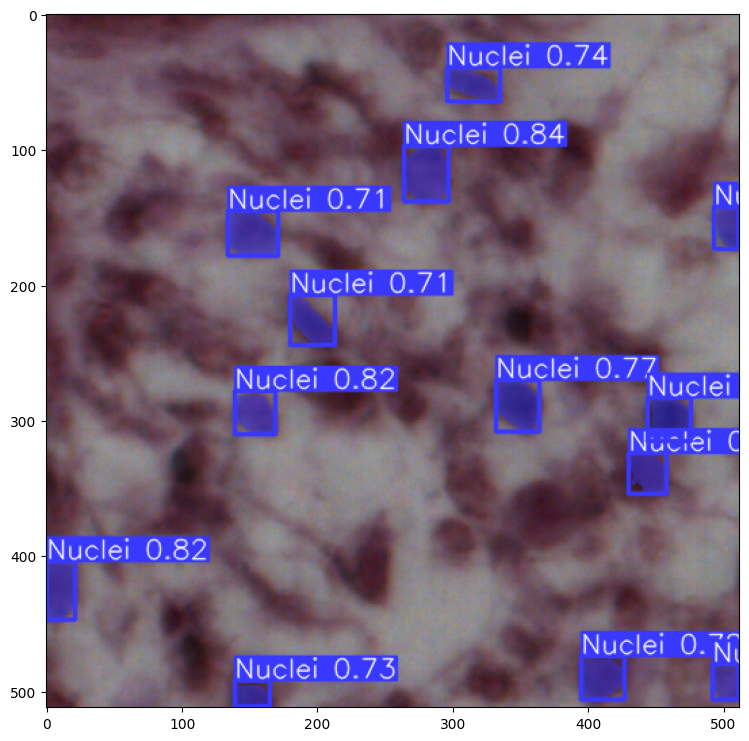

In [10]:
inference_img_path = "yolov9_dataset/val/images/human_melanoma_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_pancreas_11.png: 640x640 32 Nucleis, 81.4ms
Speed: 25.4ms preprocess, 81.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


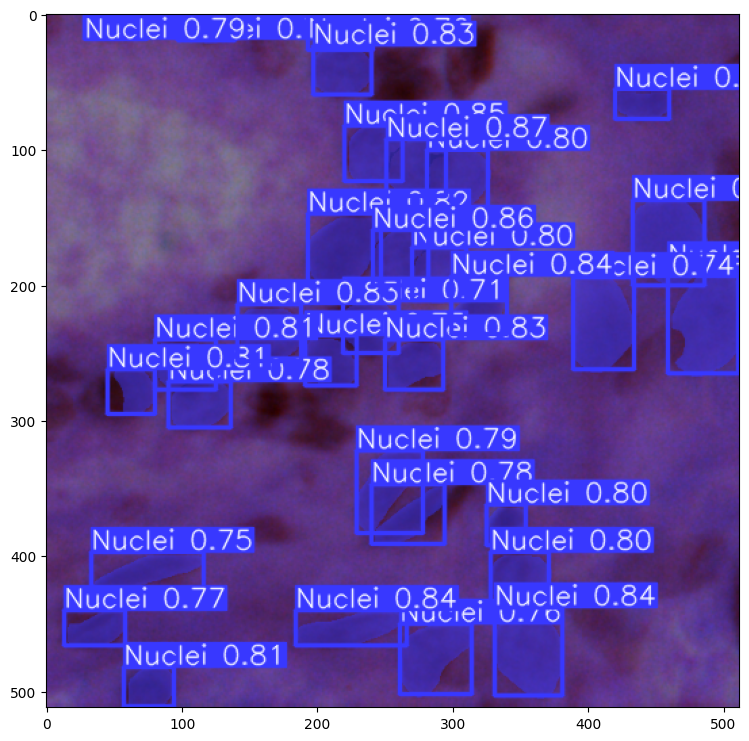

In [11]:
inference_img_path = "yolov9_dataset/val/images/human_pancreas_11.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9c-640/v9c_workspace_640/9c_workspace_640/yolov9_dataset/val/images/human_peritoneum_3.png: 640x640 14 Nucleis, 79.2ms
Speed: 6.7ms preprocess, 79.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


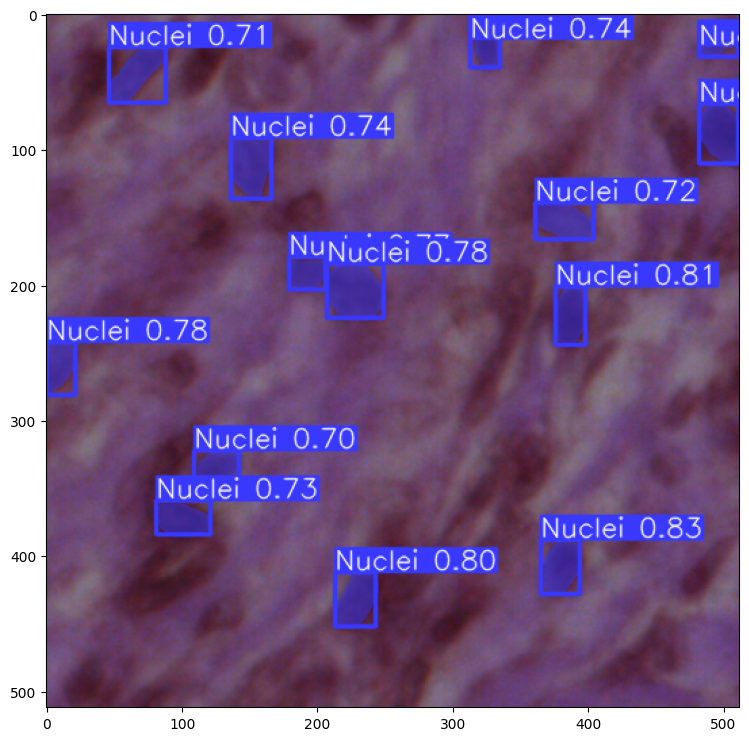

In [12]:
inference_img_path = "yolov9_dataset/val/images/human_peritoneum_3.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)

In [55]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [60]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [64]:
import shutil

# Define the paths
source_dir = '/content/yolov9_dataset'
destination_dir = '/content/drive/MyDrive/Yolov9c_exp'

# Copy the directory to Google Drive
shutil.copytree(source_dir, destination_dir)


'/content/drive/MyDrive/Yolov9c_exp'